<p><font size="6"><b> Introduction to geospatial vector data in Python</b></font></p>

In [1]:
from matplotlib import *

from matplotlib import pyplot as plt
import matplotlib.cm as cm

import pandas as pd
import geopandas as gpd

## Importing geospatial data

Geospatial data is often available from specific GIS (geographic information system) file formats or data stores, like ESRI shapefiles, GeoJSON files, geopackage files, PostGIS (PostgreSQL) database, ...

You can find free shapefiles for countries, continents or regions and cities from many online sources, like GADM https://gadm.org/download_country.html  

We can use the GeoPandas library to read many of those GIS file formats using the `geopandas.read_file` function.

For example, let's start by reading a shapefile with Italian provinces from https://public.opendatasoft.com/explore/dataset/georef-italy-provincia/information/, and inspect the data:

In [77]:
italy_prov = gpd.read_file('../data/georef-italy-provincia/georef-italy-provincia-millesime.shp')


In [78]:
italy_prov.head()

,year,rip_code,rip_name,reg_code,reg_name,prov_code,prov_name,prov_name_u,prov_name_l,prov_area_c,prov_type,prov_sigla,geometry
0,2022,3,Centro,9,Toscana,53,Grosseto,GROSSETO,grosseto,ITA,Provincia,GR,"MULTIPOLYGON (((11.10968 42.26361, 11.11032 42..."
1,2022,1,Nord-Ovest,3,Lombardia,18,Pavia,PAVIA,pavia,ITA,Provincia,PV,"MULTIPOLYGON (((8.81427 45.01739, 8.81295 45.0..."
2,2022,5,Isole,20,Sardegna,91,Nuoro,NUORO,nuoro,ITA,Provincia,NU,"MULTIPOLYGON (((9.70271 39.97525, 9.70352 39.9..."
3,2022,2,Nord-Est,4,Trentino-Alto Adige,21,Bolzano,BOLZANO,bolzano,ITA,Provincia autonoma,BZ,"POLYGON ((12.47759 46.67982, 12.47518 46.67888..."
4,2022,2,Nord-Est,5,Veneto,227,Venezia,VENEZIA,venezia,ITA,Citta metropolitana,VE,"POLYGON ((12.66165 45.79243, 12.6632 45.79217,..."


<Axes: >

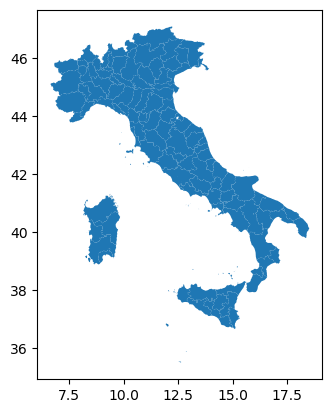

In [4]:
italy_prov.plot()

In [5]:
italy_prov.explore()

What do we observe:

- Using `.head()` we can see the first rows of the dataset, just like we can do with Pandas.
- There is a `geometry` column and the different countries are represented as polygons
- We can use the `.plot()` (matplotlib) or `explore()` (Folium / Leaflet.js) method to quickly get a *basic* visualization of the data

## What's a GeoDataFrame?

We used the GeoPandas library to read in the geospatial data, and this returned us a `GeoDataFrame`:

In [6]:
type(italy_prov)

geopandas.geodataframe.GeoDataFrame

A GeoDataFrame contains a tabular, geospatial dataset:

* It has a **'geometry' column** that holds the geometry information (or features in GeoJSON).
* The other columns are the **attributes** (or properties in GeoJSON) that describe each of the geometries

Such a `GeoDataFrame` is just like a pandas `DataFrame`, but with some additional functionality for working with geospatial data:

* A `.geometry` attribute that always returns the column with the geometry information (returning a GeoSeries). The column name itself does not necessarily need to be 'geometry', but it will always be accessible as the `.geometry` attribute.
* It has some extra methods for working with spatial data (area, distance, buffer, intersection, ...), which we will learn in later notebooks

In [7]:
italy_prov.geometry

0      MULTIPOLYGON (((11.10968 42.26361, 11.11032 42...
1      MULTIPOLYGON (((8.81427 45.01739, 8.81295 45.0...
2      MULTIPOLYGON (((9.70271 39.97525, 9.70352 39.9...
3      POLYGON ((12.47759 46.67982, 12.47518 46.67888...
4      POLYGON ((12.66165 45.79243, 12.6632 45.79217,...
                             ...                        
102    POLYGON ((9.48391 45.44869, 9.48388 45.44777, ...
103    POLYGON ((12.39676 44.79068, 12.39811 44.79278...
104    MULTIPOLYGON (((16.20087 41.81626, 16.20146 41...
105    POLYGON ((9.89108 45.1309, 9.88822 45.13237, 9...
106    MULTIPOLYGON (((14.1007 37.53744, 14.09972 37....
Name: geometry, Length: 107, dtype: geometry

**It's still a DataFrame**, so we have all the Pandas functionality available to use on the geospatial dataset, and to do data manipulations with the attributes and geometry information together.

For example, we can access all the possible categories in the "prov_type" columns:

In [17]:
italy_prov.prov_type.unique()

array(['Provincia', 'Provincia autonoma', 'Citta metropolitana',
       'Libero consorzio di comuni', 'Unità non amministrativa'],
      dtype=object)

and see which of these are "Provincia autonoma" or "Citta metropolitana"

In [30]:
una = italy_prov[italy_prov.prov_type=='Citta metropolitana']
una

,year,rip_code,rip_name,reg_code,reg_name,prov_code,prov_name,prov_name_u,prov_name_l,prov_area_c,prov_type,prov_sigla,geometry
4,2022,2,Nord-Est,5,Veneto,227,Venezia,VENEZIA,venezia,ITA,Citta metropolitana,VE,"POLYGON ((12.66165 45.79243, 12.6632 45.79217,..."
6,2022,4,Sud,16,Puglia,272,Bari,BARI,bari,ITA,Citta metropolitana,BA,"MULTIPOLYGON (((17.28022 40.77887, 17.28012 40..."
33,2022,2,Nord-Est,8,Emilia-Romagna,237,Bologna,BOLOGNA,bologna,ITA,Citta metropolitana,BO,"POLYGON ((11.20242 44.10074, 11.19831 44.10207..."
71,2022,3,Centro,9,Toscana,248,Firenze,FIRENZE,firenze,ITA,Citta metropolitana,FI,"POLYGON ((10.96411 43.81248, 10.96473 43.81166..."
78,2022,4,Sud,18,Calabria,280,Reggio di Calabria,REGGIO DI CALABRIA,reggio di calabria,ITA,Citta metropolitana,RC,"POLYGON ((15.91857 38.50677, 15.91937 38.50711..."
79,2022,1,Nord-Ovest,1,Piemonte,201,Torino,TORINO,torino,ITA,Citta metropolitana,TO,"POLYGON ((7.89579 45.59003, 7.8952 45.58931, 7..."
80,2022,3,Centro,12,Lazio,258,Roma,ROMA,roma,ITA,Citta metropolitana,RM,"POLYGON ((13.03055 42.11538, 13.03291 42.11416..."
81,2022,5,Isole,19,Sicilia,287,Catania,CATANIA,catania,ITA,Citta metropolitana,CT,"MULTIPOLYGON (((15.16661 37.56219, 15.16798 37..."
85,2022,1,Nord-Ovest,3,Lombardia,215,Milano,MILANO,milano,ITA,Citta metropolitana,MI,"MULTIPOLYGON (((9.43855 45.18764, 9.44023 45.1..."
93,2022,5,Isole,19,Sicilia,283,Messina,MESSINA,messina,ITA,Citta metropolitana,ME,"MULTIPOLYGON (((15.30078 37.85074, 15.3015 37...."


and then plot these provinces

In [31]:
una.explore()

---
 
A few resources in case you want to learn more about pandas:

- Pandas docs: https://pandas.pydata.org/pandas-docs/stable/10min.html
- Other tutorials: chapter from pandas in https://jakevdp.github.io/PythonDataScienceHandbook/, https://github.com/jorisvandenbossche/pandas-tutorial, https://github.com/TomAugspurger/pandas-head-to-tail, ...

<div class="alert alert-info" style="font-size:120%">

**REMEMBER:** <br>

* A `GeoDataFrame` allows to perform typical tabular data analysis together with spatial operations
* A `GeoDataFrame` (or *Feature Collection*) consists of:
    * **Geometries** or **features**: the spatial objects
    * **Attributes** or **properties**: columns with information about each spatial object

</div>

## Geometries: Points, Linestrings and Polygons

Spatial **vector** data can consist of different types, and the 3 fundamental types are:

* **Point** data: represents a single point in space.
* **Line** data ("LineString"): represents a sequence of points that form a line.
* **Polygon** data: represents a filled area.
* **MultiPolygon** data: a group of polygons, i.e. archipelagos.

And each of them can also be combined in multi-part geometries (See https://shapely.readthedocs.io/en/stable/manual.html#geometric-objects for extensive overview).

For the example we have seen up to now, the individual geometry objects are Polygons:

### The `shapely` library

The individual geometry objects are provided by the [`shapely`](https://shapely.readthedocs.io/en/stable/) library

To construct one ourselves:

In [34]:
from shapely.geometry import Point, Polygon, LineString

In [35]:
p = Point(0, 0)

In [36]:
print(p)

POINT (0 0)


In [37]:
polygon = Polygon([(1, 1), (2,2), (2, 1)])

In [38]:
polygon.area

0.5

In [41]:
polygon.distance(p)

1.4142135623730951

<div class="alert alert-info" style="font-size:120%">

**REMEMBER**: <br>

Single geometries are represented by `shapely` objects:

* If you access a single geometry of a GeoDataFrame, you get a shapely geometry object
* Those objects have similar functionality as geopandas objects (GeoDataFrame/GeoSeries). For example:
    * `single_shapely_object.distance(other_point)` -> distance between two points
    * `geodataframe.distance(other_point)` ->  distance for each point in the geodataframe to the other point

</div>

## Plotting our different layers together

(5.0, 20.0, 35.0, 48.0)

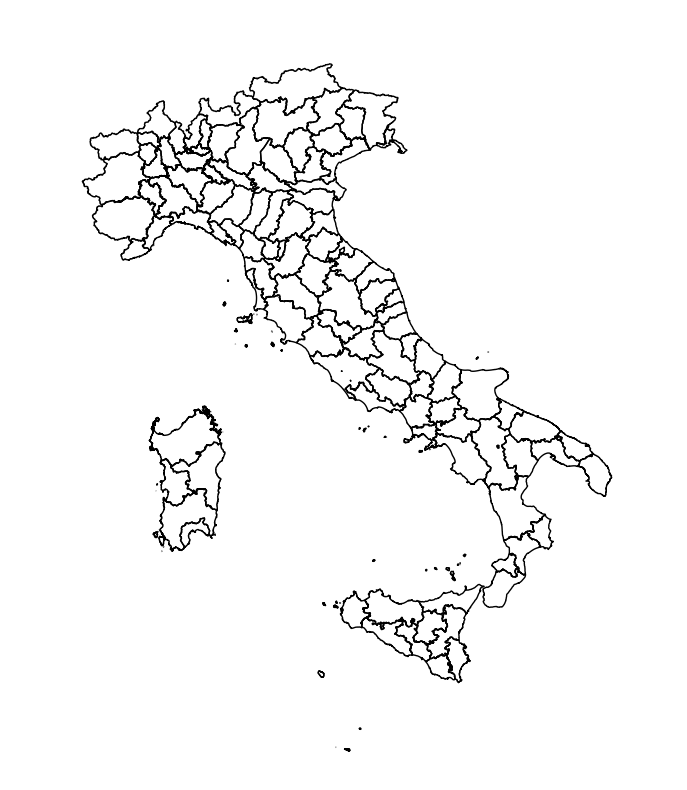

In [53]:
# fig, ax = plt.subplots(figsize=(15, 10))
ax = italy_prov.plot(edgecolor='k', facecolor='none', figsize=(15, 10))

ax.set(xlim=(5, 20), ylim=(35, 48))
ax.axis('off')

## Let's practice!

Throughout the exercises in this course, we will work with several datasets about the city of Paris.

Here, we start with the following datasets:

- The administrative districts of Paris (https://opendata.paris.fr/explore/dataset/quartier_paris/): `paris_districts_utm.geojson`
- Real-time (at the moment I downloaded them ..) information about the public bicycle sharing system in Paris (vélib, https://opendata.paris.fr/explore/dataset/stations-velib-disponibilites-en-temps-reel/information/): `data/paris_bike_stations_mercator.gpkg`

Both datasets are provided as spatial datasets using a GIS file format.

Let's explore further those datasets, now using the spatial aspect as well.

<div class="alert alert-success">

**EXERCISE 1**:
    
* How many features are there in the dataset?
* How many provinces are there?
* How many types of provinces are there?
    
<details><summary>Hints</summary>

* Use `.columns` to check all features of the dataset
* The `.size` to check the n of rows in the dataset
* Use the `.unique` to list all the categorical values of feature

</details>
    
    
</div>

<div class="alert alert-success">

**EXERCISE 2**:

* Make a plot of the dataset.
* Make the plot a bit larger by setting the figure size to (12, 6) (hint: the `plot` method accepts a `figsize` keyword).

<details><summary>Hints</summary>

* Use `.figsize` to set the canvas measures

</details>

</div>

<div class="alert alert-success">

**EXERCISE 3**:

* Add a column `'area'` representing the area of the provinces.
* Plot the provinces using the `'area'` to color the polygons. For this, use the `column=` keyword.
* Use the `legend=True` keyword to show a color bar.

</div>

In [59]:
italy_prov['area'] = italy_prov.area

/var/folders/q5/29y9rnzj2_3f5fwgkltpph4h0000gn/T/ipykernel_10064/1478994511.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  italy_prov['area'] = italy_prov.area
